In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [80]:
import cv2
import glob
import pandas as pd
import random
from PIL import Image
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt

In [7]:
path = '/content/drive/MyDrive/pet'
sample_img = sorted(glob.glob(path+'/json/*.jpg'))
sample_json = sorted(glob.glob(path+'/json/*.json'))
sample = 'A_10_CHI_CM_20221129_10_001213_01'
sample = cv2.imread(f'{path}/input_img/{sample}.jpg')
label_mapping = pd.read_csv(f'{path}/DiseaseCode.csv')

In [65]:
train = pd.read_csv(f'{path}/train2.csv')
train['breeds'] = train['path'].str[-32:-29]

In [66]:
train.drop(['Unnamed: 0.2', 'Unnamed: 0', 'Unnamed: 0.1'], axis=1)

,path,disease_code,disease_name,breeds
0,/content/drive/MyDrive/pet/resized2/A_10_CHI_C...,13,Healthy,CHI
1,/content/drive/MyDrive/pet/resized2/A_10_CHI_C...,13,Healthy,CHI
2,/content/drive/MyDrive/pet/resized2/A_10_CHI_C...,13,Healthy,CHI
3,/content/drive/MyDrive/pet/resized2/A_10_CHI_C...,13,Healthy,CHI
4,/content/drive/MyDrive/pet/resized2/A_10_CHI_C...,13,Healthy,CHI
...,...,...,...,...
8301,/content/drive/MyDrive/pet/resized2/B_10_POO_C...,13,Healthy,POO
8302,/content/drive/MyDrive/pet/resized2/B_10_POO_C...,13,Healthy,POO
8303,/content/drive/MyDrive/pet/resized2/B_10_POO_C...,13,Healthy,POO
8304,/content/drive/MyDrive/pet/resized2/B_10_POO_C...,13,Healthy,POO


In [45]:
lst = ['MAL', 'POO', 'POM', 'CHI', 'DRI', 'GOL', 'JIN', 'MIX', 'KOR', 'RUS', 'PER', 'SIA', 'TUR', 'SCO', 'ETC']
cnt = []
for i in lst:
    cnt.append([i,0])

In [46]:
cnt

[['MAL', 0],
 ['POO', 0],
 ['POM', 0],
 ['CHI', 0],
 ['DRI', 0],
 ['GOL', 0],
 ['JIN', 0],
 ['MIX', 0],
 ['KOR', 0],
 ['RUS', 0],
 ['PER', 0],
 ['SIA', 0],
 ['TUR', 0],
 ['SCO', 0],
 ['ETC', 0]]

In [52]:
for i in range(len(train['path'])):
    idx = lst.index(train['path'][i][-32:-29])
    cnt[idx][1] += 1

In [53]:
cnt

[['MAL', 2362],
 ['POO', 1909],
 ['POM', 1109],
 ['CHI', 215],
 ['DRI', 410],
 ['GOL', 86],
 ['JIN', 65],
 ['MIX', 708],
 ['KOR', 0],
 ['RUS', 0],
 ['PER', 0],
 ['SIA', 0],
 ['TUR', 0],
 ['SCO', 0],
 ['ETC', 1442]]

In [55]:
cnt_x = [x[0] for x in cnt]
cnt_y = [x[1] for x in cnt]

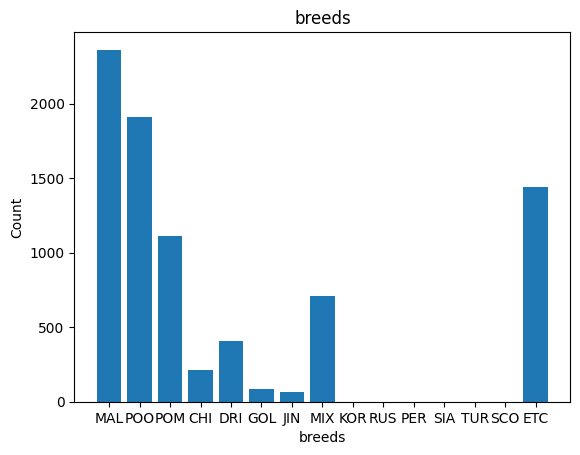

In [83]:
plt.bar(cnt_x, cnt_y)
plt.xlabel("breeds")
plt.ylabel("Count")
plt.title("breeds")
plt.show()

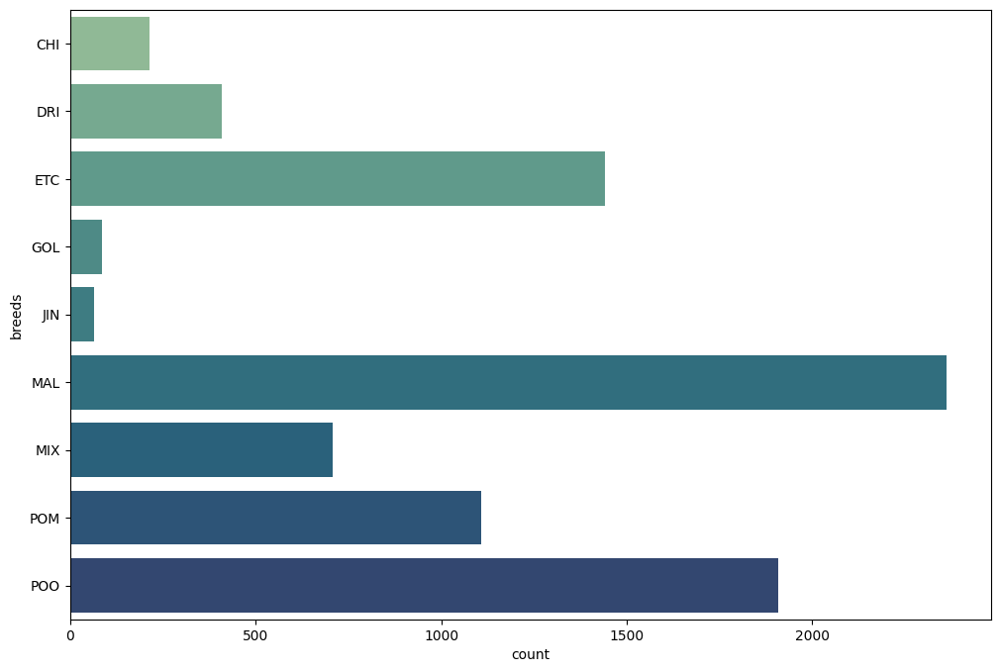

In [84]:
plt.figure(figsize=(12,8))
sns.countplot(data=train, y='breeds',  palette='crest', dodge=False)
plt.show()

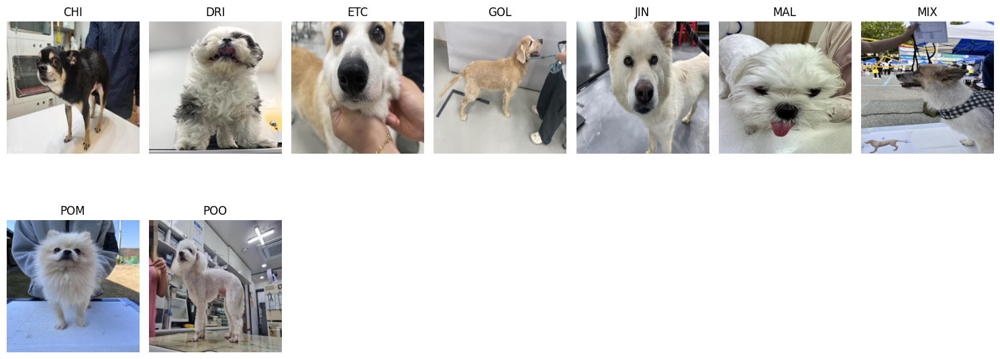

In [72]:
plt.figure(figsize = (15,12))
for idx, i in enumerate(train.breeds.unique()):
    plt.subplot(4, 7, idx+1)
    
    df = train[train['breeds'] == i].reset_index(drop = True)
    image_path = df.loc[random.randint(0, len(df)-1), 'path']
    img = Image.open(image_path)
    img = img.resize((224,224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(i)
plt.tight_layout()
plt.show()

In [78]:
def plot_images(df, label):
    plt.figure(figsize = (12,12))
    species_df = df[df['breeds'] == label].reset_index(drop = True)
    plt.suptitle(label)
    for idx, i in enumerate(np.random.choice(species_df['path'], 32)):
        plt.subplot(8,8,idx+1)
        image_path = i
        img = Image.open(image_path)
        img = img.resize((224,224))
        plt.imshow(img)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

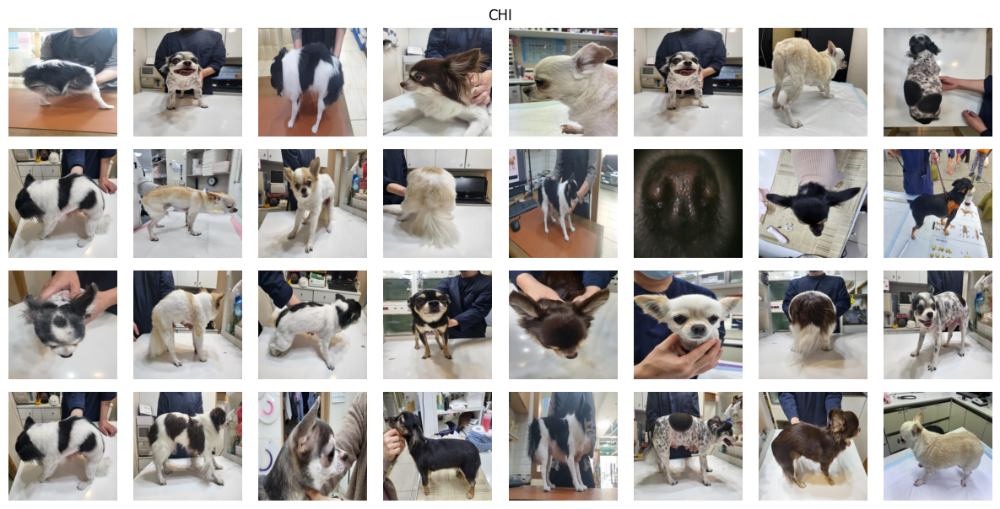

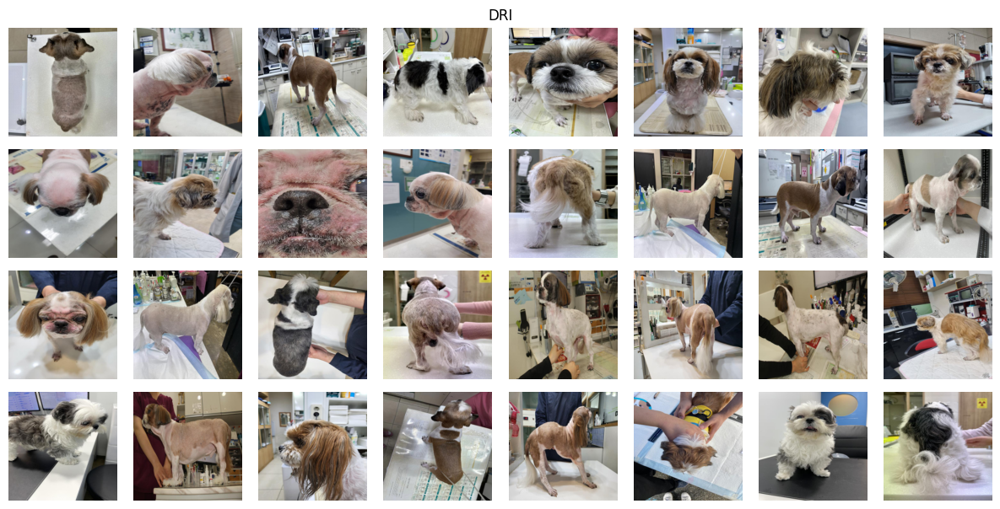

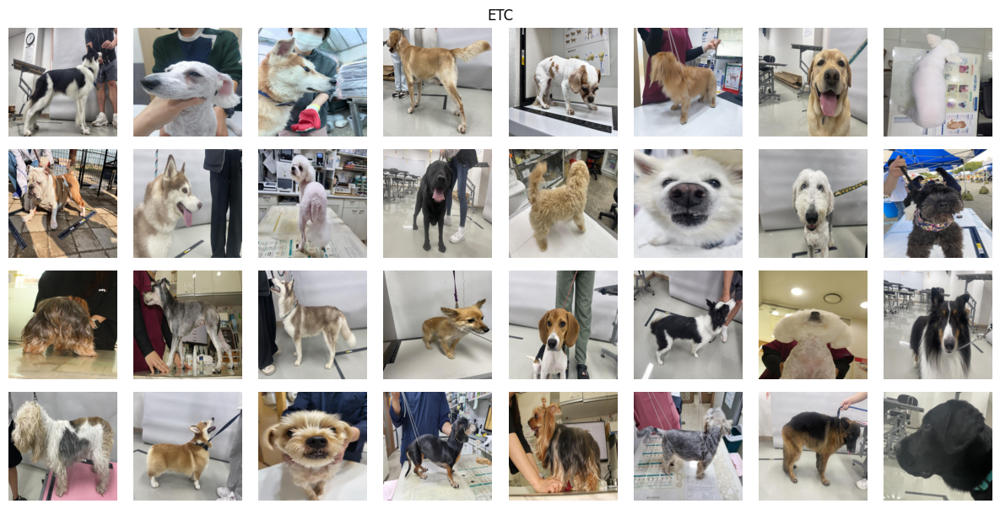

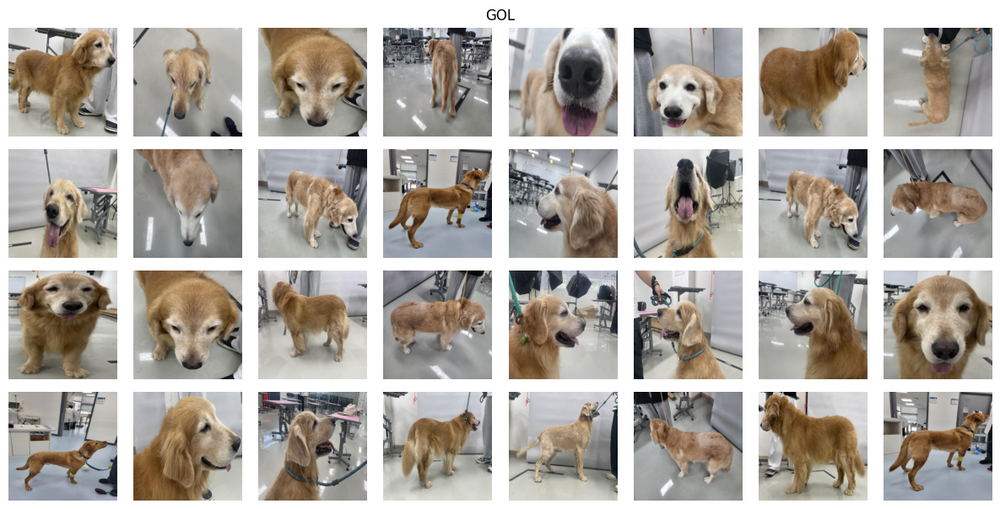

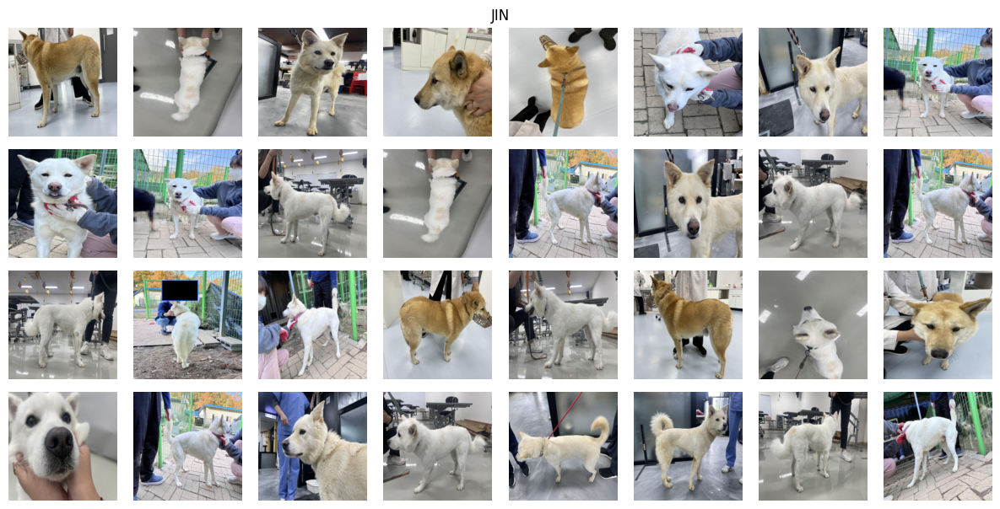

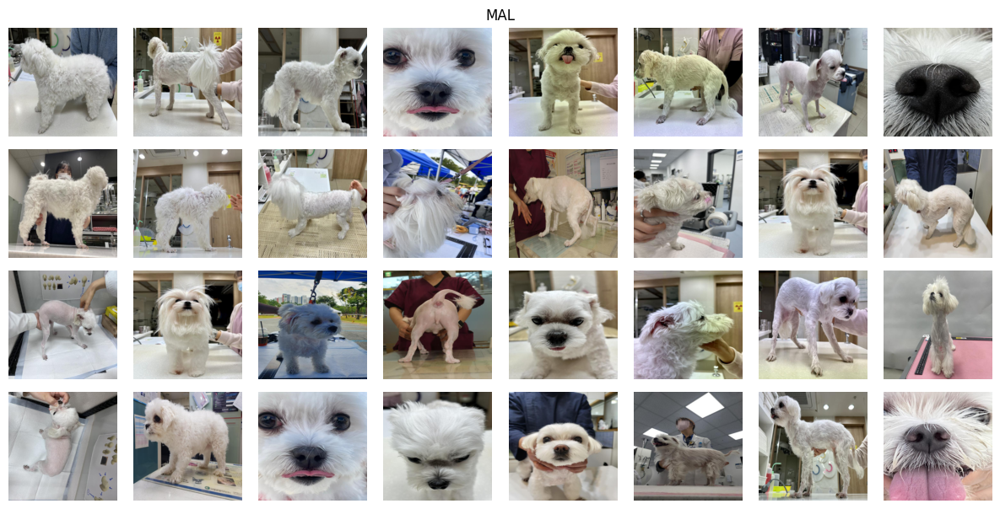

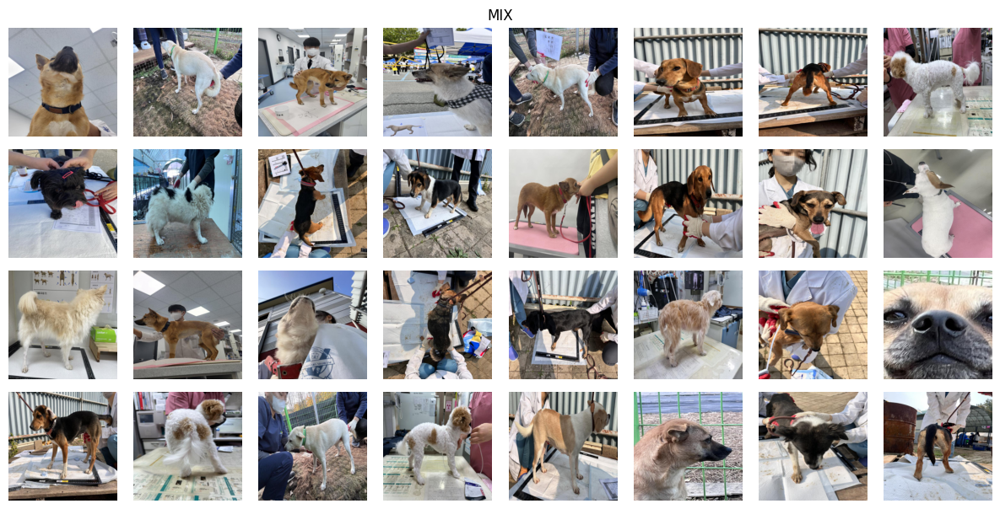

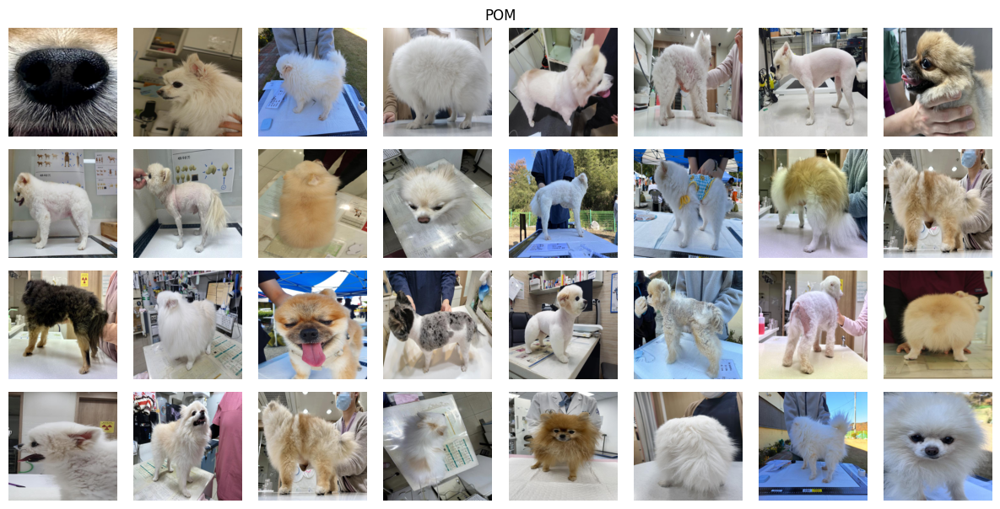

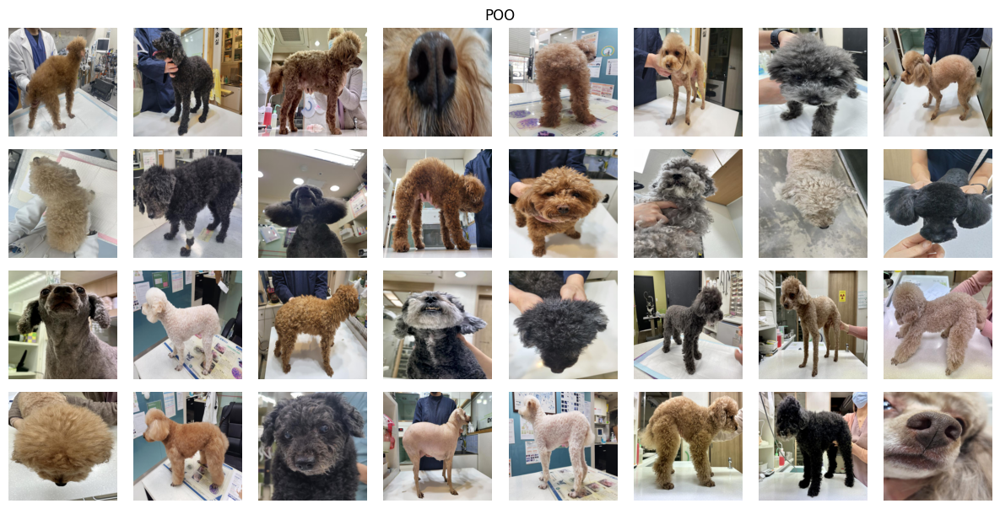

In [79]:
for la in train['breeds'].unique():
    plot_images(train , label=la)